In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from osgeo import gdal

# Viewing Original Files
The first thing I did was view the provided files in matplotlib. 

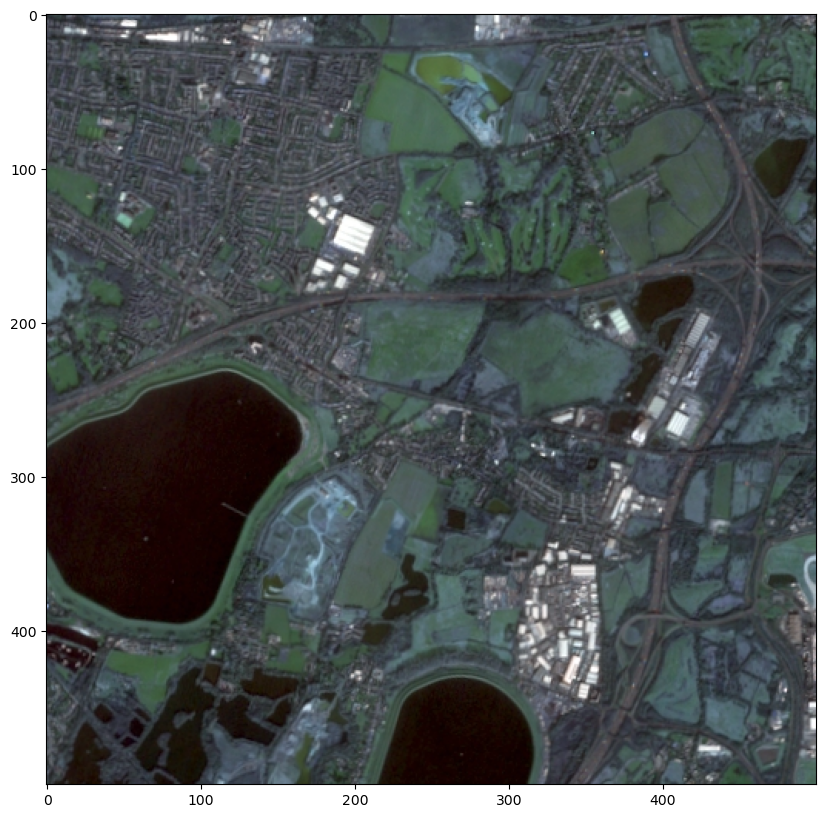

In [3]:
# Read the image using OpenCV
img = cv2.imread("/home/h00pyfr00d/Downloads/data/20230215-SE2B-CGG-GBR-MS3-L3-RGB-preview.jpg", cv2.IMREAD_COLOR)

# Render the image using Matplotlib
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(img)

/usr/lib/python3/dist-packages/osgeo/gdal.py:312: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


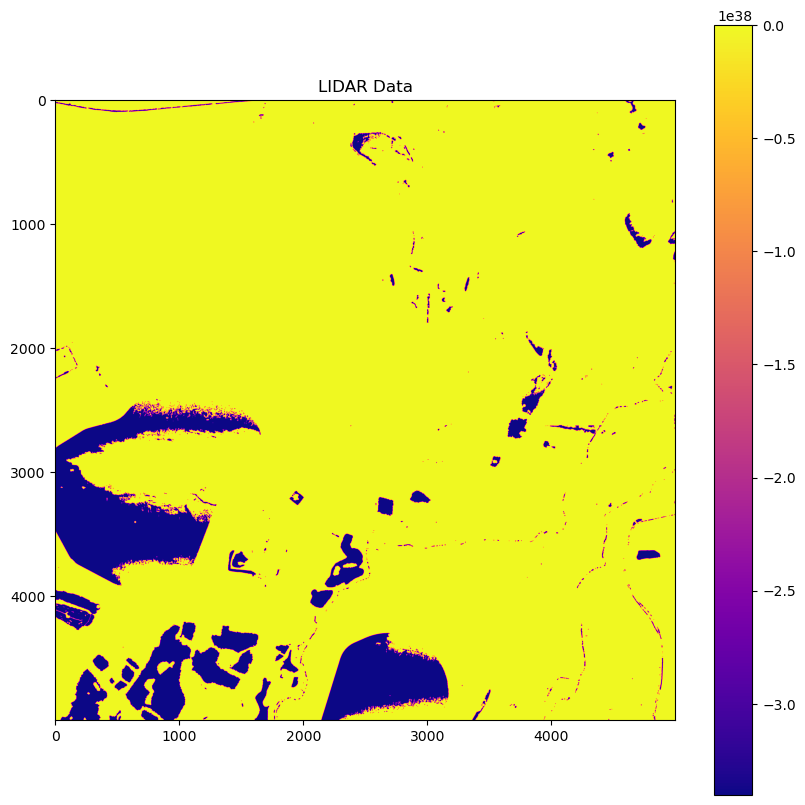

In [4]:
lidar = gdal.Open("/home/h00pyfr00d/Downloads/data/DSM_TQ0075_P_12757_20230109_20230315.tif")
# Read the first band of the LIDAR data
lidar_band = lidar.GetRasterBand(1)
lidar_data = lidar_band.ReadAsArray()

# Plot the LIDAR data using Matplotlib
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(lidar_data, cmap='plasma')
plt.colorbar()
plt.title('LIDAR Data')
plt.show()

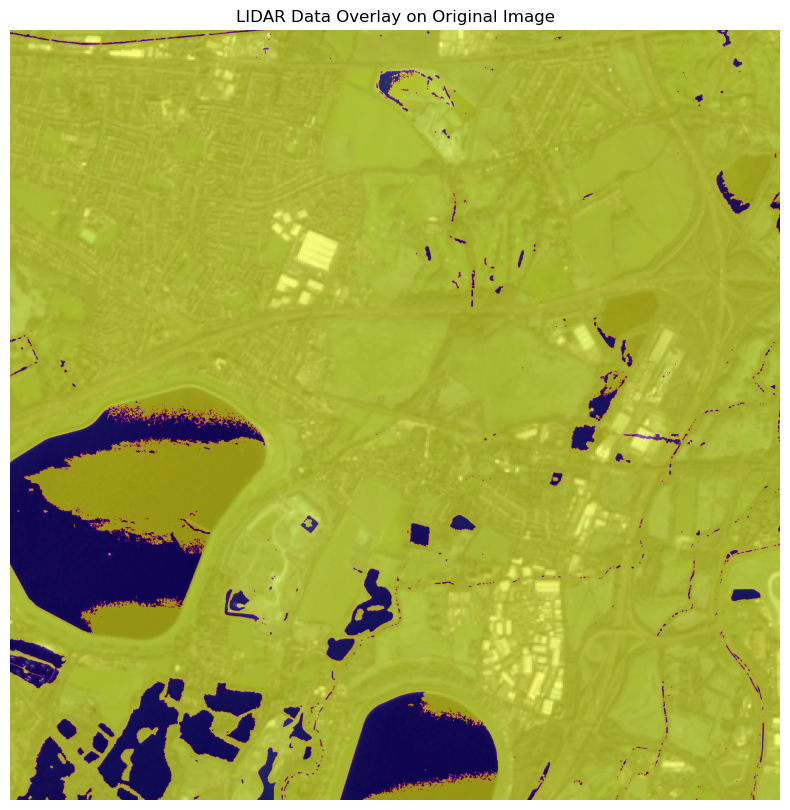

In [5]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the original image
ax.imshow(img, extent=[0, img.shape[1], 0, img.shape[0]])

# Overlay the LIDAR data with transparency
ax.imshow(lidar_data, cmap='plasma', alpha=0.6, extent=[0, img.shape[1], 0, img.shape[0]])

ax.set_title('LIDAR Data Overlay on Original Image')
ax.axis('off')

plt.show()

The LIDAR data is very difficult to discern any detail from like this. This is because there is such a difference in height between the land and the bottom of the lakes that the differences between the top of a small building are barely distinguishable from the ground.

In an attempt to fix this I tried setting a minimum threshold height, which would ensure only points above a certain height were displayed. This works largely, but in order to include houses it also includes large shallow portions of the lake

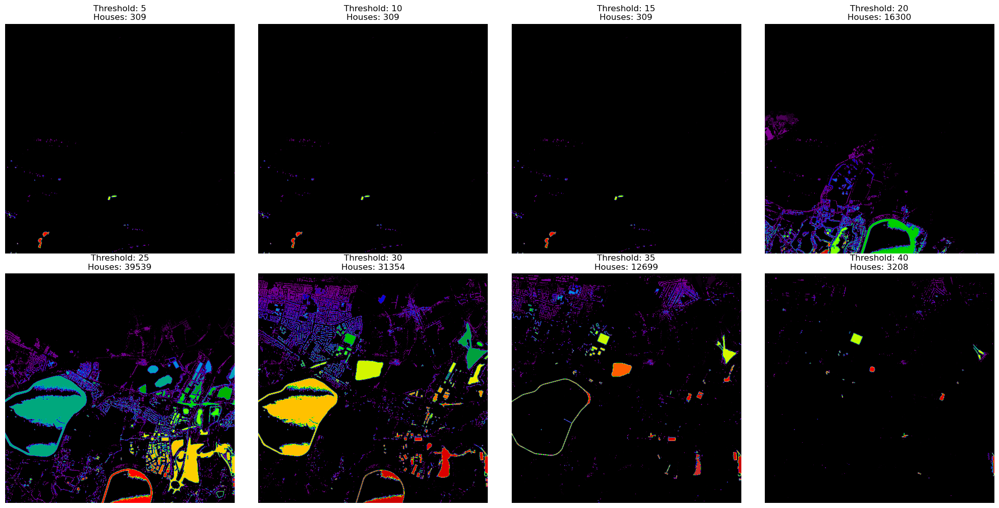

In [6]:
threshold_values = [5 * n for n in range(1, 10)]
fig, axes = plt.subplots(2, len(threshold_values) // 2, figsize=(20, 10))

for ax, threshold in zip(axes.flatten(), threshold_values):
    house_regions = lidar_data > threshold
    num_labels, labels_im = cv2.connectedComponents(house_regions.astype(np.uint8))
    
    ax.imshow(labels_im, cmap='nipy_spectral')
    ax.set_title(f'Threshold: {threshold}\nHouses: {num_labels - 1}')
    ax.axis('off')

plt.tight_layout()
plt.show()


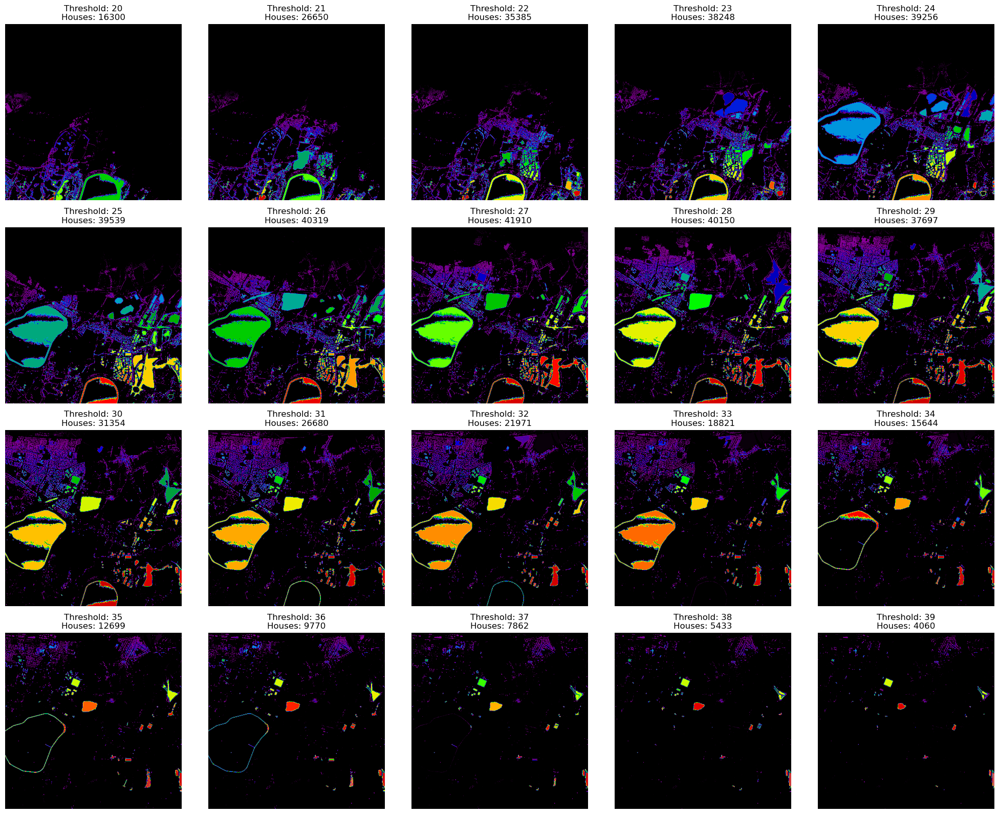

In [7]:
threshold_values = list(range(20, 40))
fig, axes = plt.subplots(4, 5, figsize=(20, 16))

for ax, threshold in zip(axes.flatten(), threshold_values):
    house_regions = lidar_data > threshold
    num_labels, labels_im = cv2.connectedComponents(house_regions.astype(np.uint8))
    
    ax.imshow(labels_im, cmap='nipy_spectral')
    ax.set_title(f'Threshold: {threshold}\nHouses: {num_labels - 1}')
    ax.axis('off')

plt.tight_layout()
plt.show()


By removing large connected components I could remove stuff like the lake and the field, but many of the buildings were missing

In [8]:
min_size = 25  # Minimum size of objects to be considered as houses
max_size = 1500  # Maximum size of objects to be considered as houses

threshold = 30
house_regions = lidar_data > threshold
num_labels, labels_im = cv2.connectedComponents(house_regions.astype(np.uint8))

# Filter out excessively large objects
filtered_labels_im = np.zeros_like(labels_im)
for label in range(1, num_labels):
    label_mask = labels_im == label
    label_size = np.sum(label_mask)
    if min_size <= label_size <= max_size:
        filtered_labels_im[label_mask] = label

fig, axes = plt.subplots(1, 2, figsize=(15, 10))

# Plot the original image
axes[0].imshow(img)
axes[0].set_title('Original Image')
axes[0].axis('off')

# Plot the filtered LIDAR data
axes[1].imshow(filtered_labels_im, cmap='nipy_spectral')
axes[1].set_title(f'Filtered LIDAR Data\nThreshold: {threshold}\nHouses: {np.max(filtered_labels_im)}')
axes[1].axis('off')

plt.tight_layout()
plt.show()

KeyboardInterrupt: 

I felt that `threshold = 30` was the best result of these as far as preserving the highest number of buildings, particularly in the top left. Many of the buildings in the bottom right were missing however. This was due to a difference in elevation between these two places. By cutting all points below the 30 height plane I was removing many of the buildings on a lower elevation 

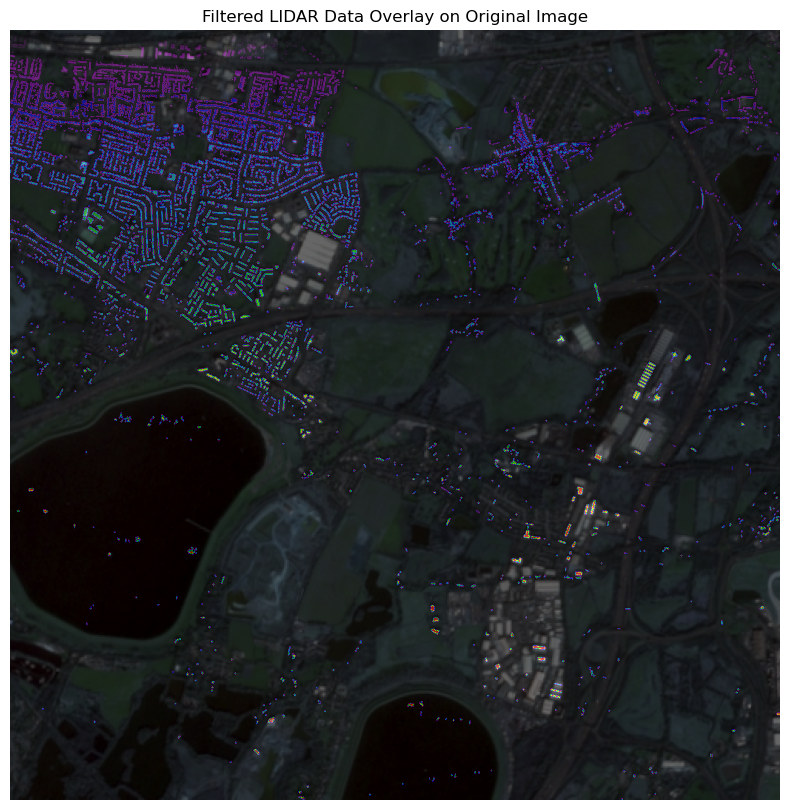

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the original image
ax.imshow(img, extent=[0, img.shape[1], 0, img.shape[0]])

# Overlay the filtered LIDAR data with transparency
ax.imshow(filtered_labels_im, cmap='nipy_spectral', alpha=0.6, extent=[0, img.shape[1], 0, img.shape[0]])

ax.set_title('Filtered LIDAR Data Overlay on Original Image')
ax.axis('off')

plt.show()

I tried normalising to remove the extreme depths, trying many different thresholds.

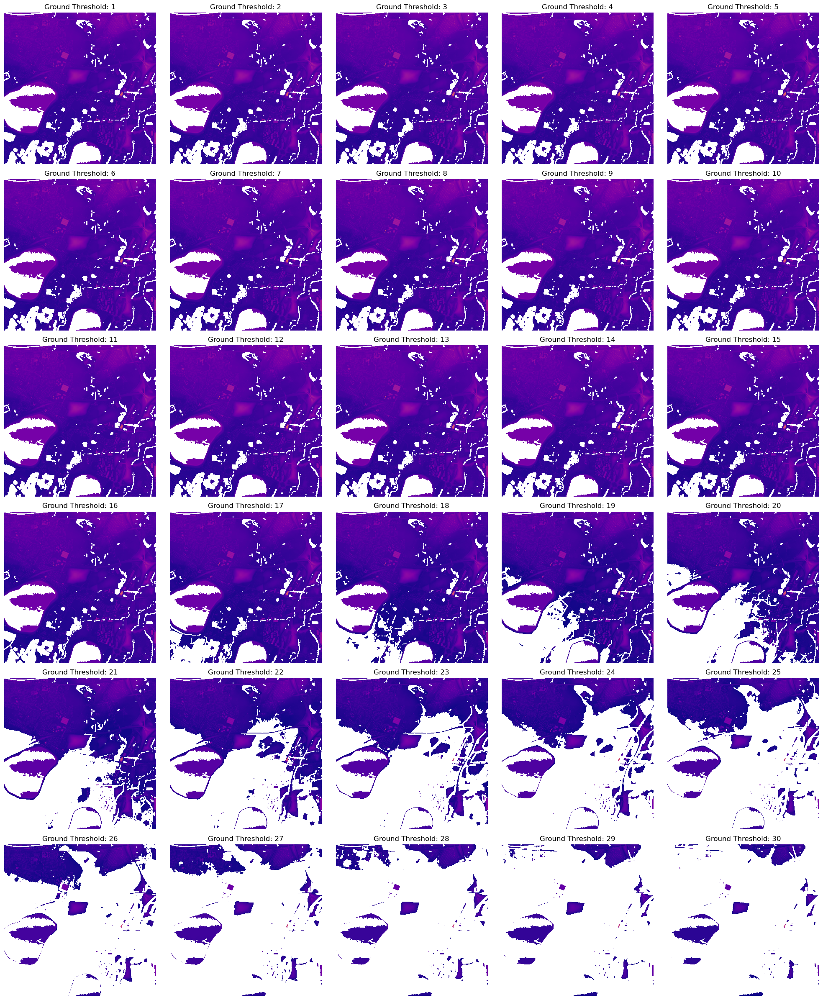

In [9]:
fig, axes = plt.subplots(6, 5, figsize=(20, 24))

for ax, ground_threshold in zip(axes.flatten(), range(1, 31)):
    # Create a mask for areas above the ground
    above_ground_mask = lidar_data > ground_threshold

    # Apply the mask to the LIDAR data
    above_ground_lidar_data = np.where(above_ground_mask, lidar_data, np.nan)

    # Plot the filtered LIDAR data
    ax.imshow(above_ground_lidar_data, cmap='plasma')
    ax.set_title(f'Ground Threshold: {ground_threshold}')
    ax.axis('off')

plt.tight_layout()
plt.show()

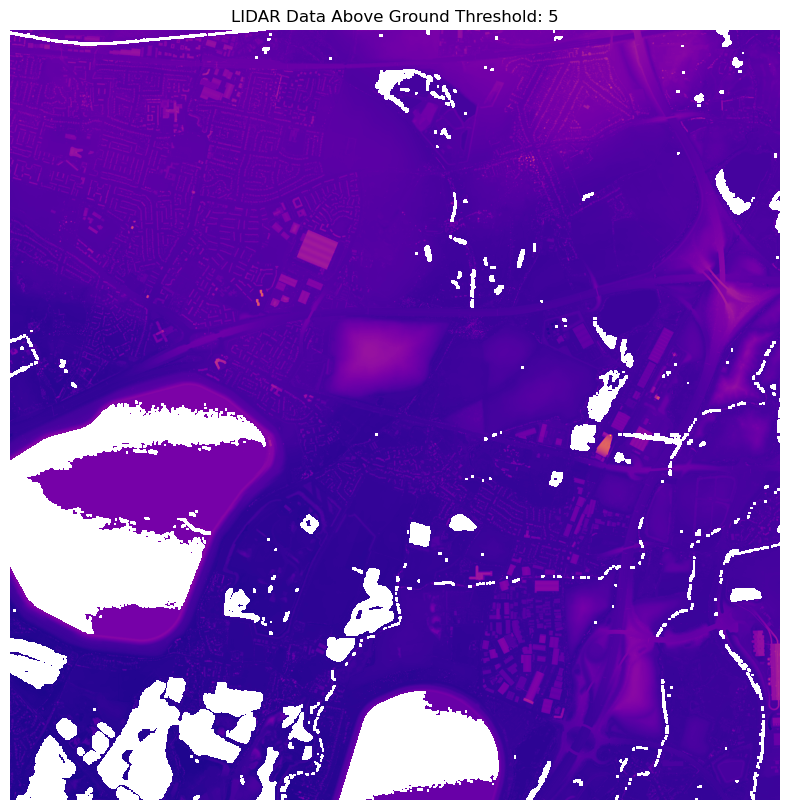

In [26]:
ground_threshold = 5

# Create a mask for areas above the ground threshold
above_ground_mask = lidar_data > ground_threshold

# Apply the mask to the LIDAR data
above_ground_lidar_data = np.where(above_ground_mask, lidar_data, np.nan)

# Plot the filtered LIDAR data
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(above_ground_lidar_data, cmap='plasma')
ax.set_title(f'LIDAR Data Above Ground Threshold: {ground_threshold}')
ax.axis('off')

plt.show()

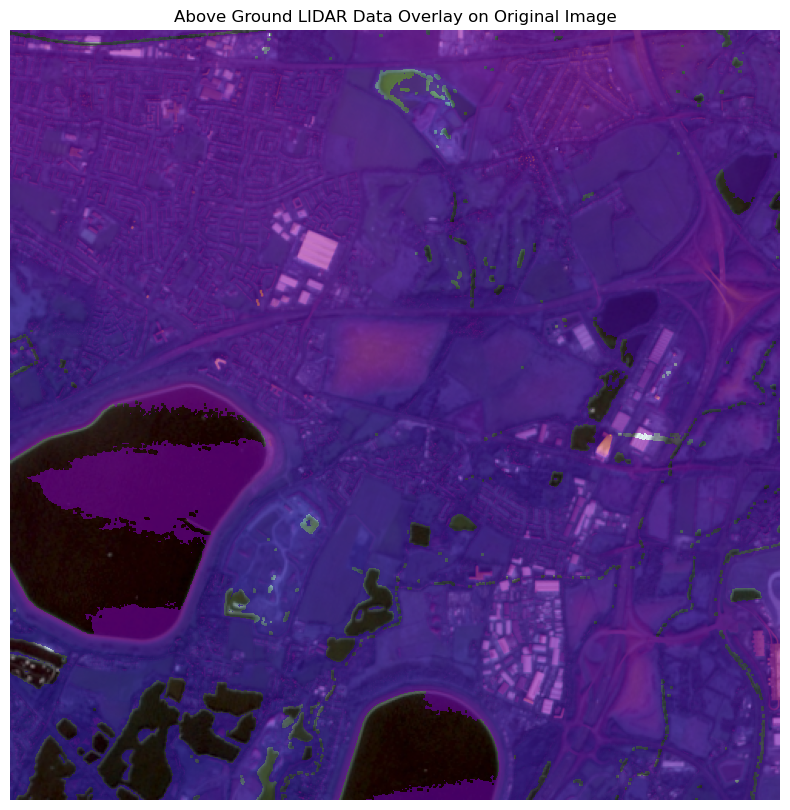

In [27]:
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the original image
ax.imshow(img, extent=[0, img.shape[1], 0, img.shape[0]])

# Overlay the above ground LIDAR data with transparency
ax.imshow(above_ground_lidar_data, cmap='plasma', alpha=0.6, extent=[0, img.shape[1], 0, img.shape[0]])

ax.set_title('Above Ground LIDAR Data Overlay on Original Image')
ax.axis('off')

plt.show()


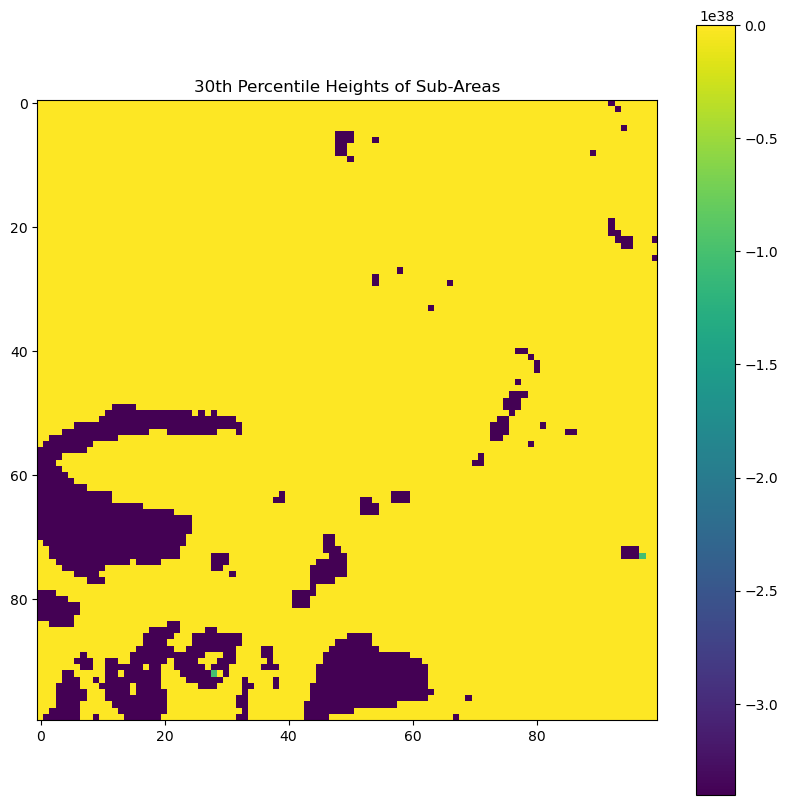

In [34]:
# Define the size of the sub-areas
sub_area_size_x = 50
sub_area_size_y = 50

# Calculate the number of sub-areas in x and y directions
num_sub_areas_x = lidar_data.shape[1] // sub_area_size_x
num_sub_areas_y = lidar_data.shape[0] // sub_area_size_y

# Initialize an array to store the 30th percentile heights
percentile_30_heights = np.zeros((num_sub_areas_y, num_sub_areas_x))

# Loop through each sub-area and calculate the 30th percentile height
for i in range(num_sub_areas_y):
    for j in range(num_sub_areas_x):
        sub_area = lidar_data[i*sub_area_size_y:(i+1)*sub_area_size_y, j*sub_area_size_x:(j+1)*sub_area_size_x]
        percentile_30_heights[i, j] = np.percentile(sub_area, 30)

# Plot the 30th percentile heights
fig, ax = plt.subplots(figsize=(10, 10))
cax = ax.imshow(percentile_30_heights, cmap='viridis')
ax.set_title('30th Percentile Heights of Sub-Areas')
plt.colorbar(cax, ax=ax, orientation='vertical')
plt.show()

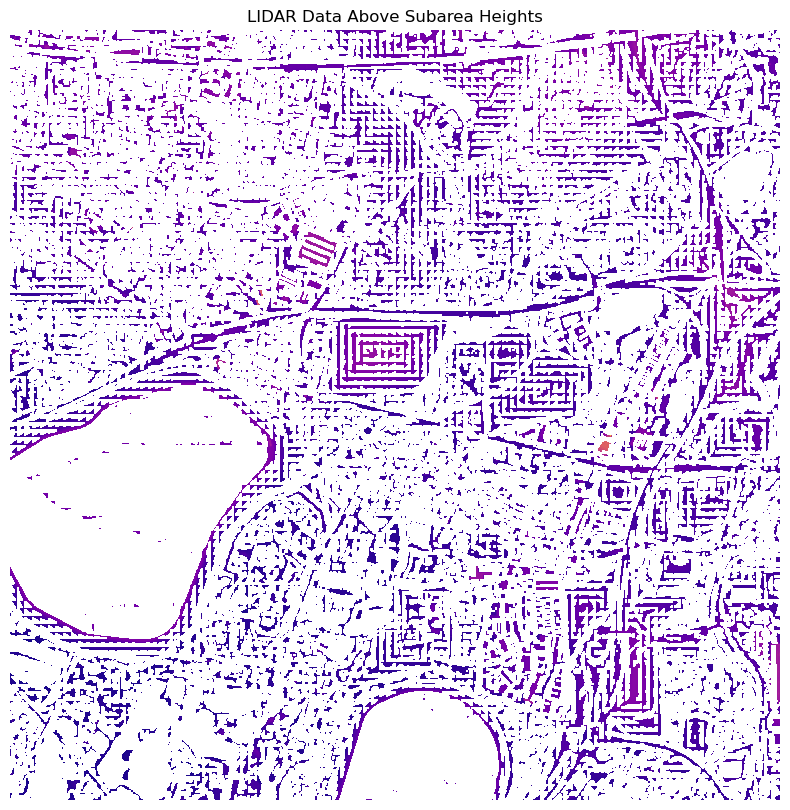

In [35]:
# Create a mask for points above their subarea heights
above_subarea_mask = above_ground_lidar_data > percentile_30_heights.repeat(sub_area_size_y, axis=0).repeat(sub_area_size_x, axis=1)

# Apply the mask to the above_ground_lidar_data
above_subarea_lidar_data = np.where(above_subarea_mask, above_ground_lidar_data, np.nan)

# Plot the filtered LIDAR data
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(above_subarea_lidar_data, cmap='plasma')
ax.set_title('LIDAR Data Above Subarea Heights')
ax.axis('off')

plt.show()